In [1]:
!pip install datasets transformers torch torchvision wandb

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 16.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 9.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 9.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 13.3 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2024.10.0
    Uninstalling fsspec-2024.10.0:
      Successfully uninstalled fsspec-2024.10.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2024.10.0 requires fsspec==2024.10.0, but you have fsspec 2024.9.0 which is incompatible.


Base code from https://www.kaggle.com/code/shnakazawa/image-classification-with-pytorch-and-efficientnet, improved iteratively using Perplexity Pro using GPT4o.

In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset
import torch
import torch.nn as nn
import torch.optim as optim
from collections import Counter
from PIL import Image
import timm

import os
import numpy as np
import pandas as pd
import math
import time
import random
import gc
import cv2
from pathlib import Path
from tqdm.notebook import tqdm
from sklearn.model_selection import StratifiedKFold

# Image augmentation
import albumentations as A
from albumentations.pytorch import ToTensorV2

# Modeling
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import timm
from torch.optim.lr_scheduler import ReduceLROnPlateau
from sklearn.metrics import f1_score

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from datasets import load_dataset
from tqdm.notebook import trange, tqdm
import pickle

print(f'PyTorch version {torch.__version__}')
print(f'Albumentations version {A.__version__}')

def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = True

seed_everything(12)

/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


PyTorch version 2.5.1+cu121
Albumentations version 1.4.20


# What will we do?

The problem of trash classification is approached by doing some data preprocessing and exploration. The dataset will be loaded and preprocessed to understand the structural class distribution and quality of images. To handle class imbalance and improve model generalization, augmentation techniques such as rotation, flipping, and color jittering will be employed. The images will be resized to a consistent shape, then normalized to scale pixel values, and converted to tensors suitable for model input. A train-validation split will ensure effective evaluation during training. This method gives a good backbone for model development, but the preprocessing pipeline may need iterative refinement to suit diverse data characteristics.

This involves the use of a transfer learning-based approach for the model architecture, considering the pre-training of convolutional neural networks, including ResNet50 or EfficientNet. Such methods involve the fine-tuning of these models on the dataset, removing the last layers and adding one's own classifier specific for the categories in trash. This saves training time by reducing computational overhead while benefiting from the robust feature extraction stages of the pre-trained network. The pros are faster convergence and high performance on smaller datasets. However, the drawback lies in limited adaptability to highly specialized or unseen data features, which may require custom architecture exploration.

Incorporating MLOps tools, the workflow includes GitHub Actions for CI/CD, Hugging Face for model hosting, and Weights & Biases for experiment tracking. This pipeline will automate code testing, model training, and deployment in a reproducible and transparent way. W&B dashboards track model performance metrics, such as accuracy, precision, recall, and loss curves, for real-time insight. GitHub acts as the backbone of version control, while Hugging Face provides an easily accessible platform to share and deploy the trained model. This, in turn, makes collaboration and deployment much easier but demands careful integration and maintenance to avoid pipeline failures or version mismatches.

## Data preparation

I do not know why, but iterating the data from `load_dataset` seems is so slow that it makes the process of analyzing the data slower, even though I already use `keep_in_memory=True`. So, we will create a local variable that contains all labels and images (PIL) in an array and we will pickle it.

## Creating the pickled data

In [11]:
# dataset = load_dataset("garythung/trashnet", keep_in_memory=True)

In [ ]:
# labels = []
# images = []

# size = 300, 300

# dataset_all = dataset['train']

# for i in tqdm(range(len(dataset_all))):
#   labels.append(dataset_all[i]['label'])
#   image = dataset_all[i]['image']
#   image.thumbnail(size, Image.Resampling.LANCZOS)
#   images.append(image)

In [ ]:
# with open('labels.pickle', 'wb') as handle:
#     pickle.dump(labels, handle, protocol=pickle.HIGHEST_PROTOCOL)

# with open('images.pickle', 'wb') as handle:
#     pickle.dump(images, handle, protocol=pickle.HIGHEST_PROTOCOL)

## Loading the pickled data

In [3]:
with open("drive/MyDrive/AI_Intern/images.pickle", 'rb') as f:
    images = pickle.loads(f.read())

with open("drive/MyDrive/AI_Intern/labels.pickle", 'rb') as f:
    labels = pickle.loads(f.read())

# Exploratory Image Analysis

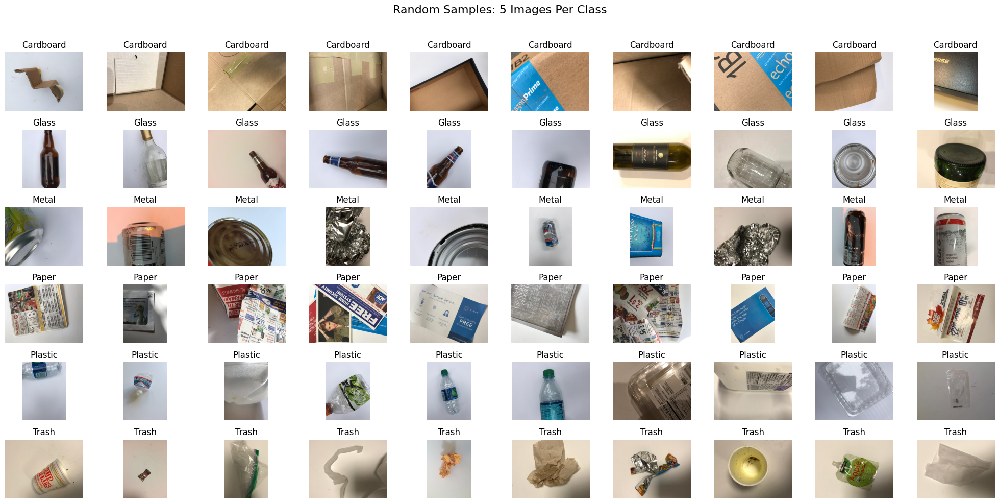

In [4]:
images_by_class = {i: [] for i in range(6)}
labels_name = ["Cardboard", "Glass", "Metal", "Paper", "Plastic", "Trash"]

for img, label in zip(images, labels):
    images_by_class[label].append(img)

fig, axes = plt.subplots(6, 10, figsize=(20, 10))
fig.suptitle("Random Samples: 5 Images Per Class", fontsize=16)

for class_id, ax_row in zip(images_by_class.keys(), axes):
    sampled_images = random.sample(images_by_class[class_id], 10)
    for img, ax in zip(sampled_images, ax_row):
        ax.imshow(img)
        ax.axis("off")
        ax.set_title(labels_name[class_id])

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

Judging from the samples above, most image have similar background: white with various kind of lighting. Interestingly, in trash, there are some sample that is made from plastic or paper. But, the plastic class seems to have segmented to those objects with "hard" plastics. Also tissue or grocery paper bag seems to be classified as trash.

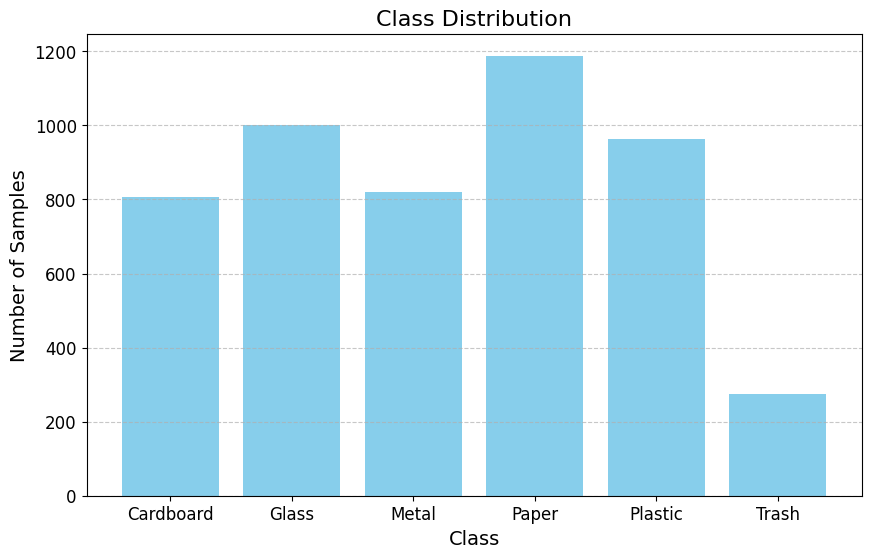

In [5]:
labels_named = [labels_name[label] for label in labels]  # Replace with your actual labels

# Count the number of samples per class
class_counts = Counter(labels_named)

# Plot the class distribution
plt.figure(figsize=(10, 6))
plt.bar(class_counts.keys(), class_counts.values(), color="skyblue")
plt.xlabel("Class", fontsize=14)
plt.ylabel("Number of Samples", fontsize=14)
plt.title("Class Distribution", fontsize=16)
plt.xticks(list(class_counts.keys()), [f"{i}" for i in class_counts.keys()], fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()

There's a slight imbalance on Trash class. Maybe we need to handle this later.

In [6]:
from sklearn.manifold import TSNE

target_size = (224, 224)
processed_images = [np.array(img.resize(target_size)).flatten() for img in images]

features = np.array(processed_images)

tsne = TSNE(n_components=2, random_state=42, perplexity=30)
features_2d = tsne.fit_transform(features)

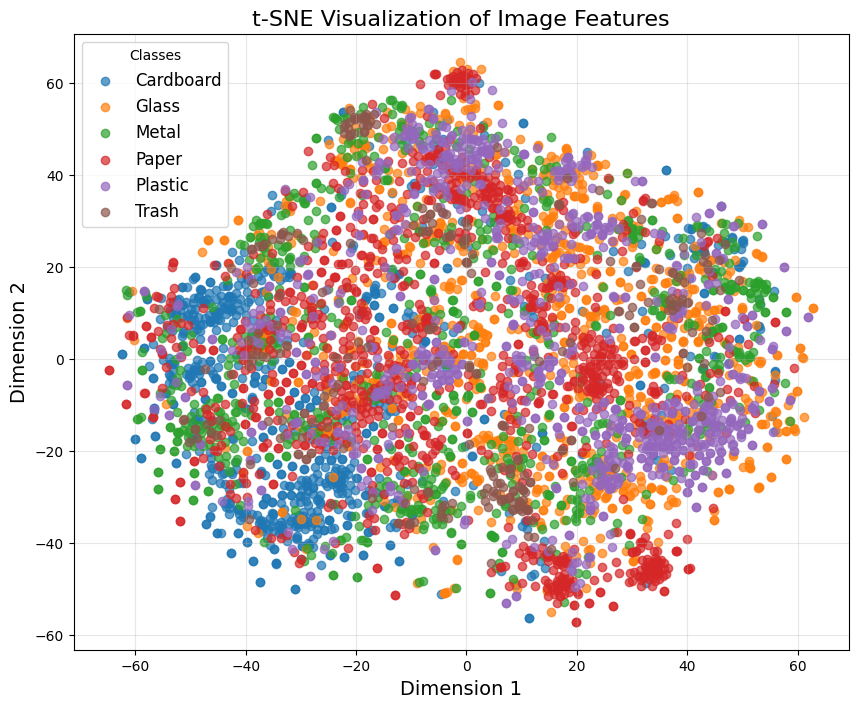

In [7]:
plt.figure(figsize=(10, 8))
for class_id in range(6):
    idx = [i for i, label in enumerate(labels) if label == class_id]
    plt.scatter(features_2d[idx, 0], features_2d[idx, 1], label=f"{labels_name[class_id]}", alpha=0.7)

plt.title("t-SNE Visualization of Image Features", fontsize=16)
plt.xlabel("Dimension 1", fontsize=14)
plt.ylabel("Dimension 2", fontsize=14)
plt.legend(title="Classes", fontsize=12)
plt.grid(alpha=0.3)
plt.show()

Using t-SNE as dimensionality reduction to be able to plot the data in 2D-space is not giving clear enough separation as there is no clear separation between each classes, other than cardboard which has an area that has lot of samples in it.

# Model Training

In [5]:
FOLD_NUM = 4
EPOCHS = 10

MODEL_DIR = '/content/save'
CSV_SAVE_DIR = '/content/save'
IMG_SAVE_DIR = '/content/save'

SEED = 42
NUM_CLASSES = 6
NUM_WORKERS = 2
BATCH_SIZE = 32
EPOCHS_FULL = 50

LR = 0.0001

In [6]:
def show_gpu_memory(device):
    print(f"Allocated GPU memory: {torch.cuda.memory_allocated(device) / 1024 / 1024:.2f} MB")
    print(f"Cached GPU memory: {torch.cuda.memory_cached(device) / 1024 / 1024:.2f} MB")


def load_img(path):
    img_bgr = cv2.imread(path)
    img_rgb = img_bgr[:, :, ::-1]
    return img_rgb


def create_gallery(array, ncols=3):
    nindex, height, width, intensity = array.shape
    nrows = nindex//ncols
    assert nindex == nrows * ncols
    result = (array.reshape(nrows, ncols, height, width, intensity)
        .swapaxes(1,2)
        .reshape(height*nrows, width*ncols, intensity))
    return result


def show_validation_score(train_acc_list, train_loss_list, valid_acc_list, valid_loss_list, save=False, save_dir=IMG_SAVE_DIR, save_name='classification_validation_score.png'):
    fig = plt.figure(figsize=(15,15))
    for i in range(FOLD_NUM):
        train_acc = train_acc_list[i]
        train_loss = train_loss_list[i]
        valid_acc = valid_acc_list[i]
        valid_loss = valid_loss_list[i]

        ax = fig.add_subplot(math.ceil(np.sqrt(FOLD_NUM))*2, math.ceil(np.sqrt(FOLD_NUM))*2, (i*2)+1, title=f'Fold {i+1}')
        ax.plot(range(EPOCHS), train_acc, c='orange', label='train')
        ax.plot(range(EPOCHS), valid_acc, c='blue', label='valid')
        ax.set_xlabel('epoch')
        ax.set_ylabel('accuracy')
        ax.legend()

        ax = fig.add_subplot(math.ceil(np.sqrt(FOLD_NUM))*2, math.ceil(np.sqrt(FOLD_NUM))*2, (i*2)+2, title=f'Fold {i+1}')
        ax.plot(range(EPOCHS), train_loss, c='orange', label='train')
        ax.plot(range(EPOCHS), valid_loss, c='blue', label='valid')
        ax.set_xlabel('epoch')
        ax.set_ylabel('loss')
        ax.legend()

    plt.tight_layout()
    if save:
        os.makedirs(save_dir, exist_ok=True)
        plt.savefig(save_dir+save_name)
    else:
        plt.show()

In [7]:
import timm
import torch.nn as nn

class ConvNextV2(nn.Module):
    def __init__(self, n_out):
        super(ConvNextV2, self).__init__()
        # Define model
        self.convnext = timm.create_model(
            "hf_hub:timm/convnextv2_atto.fcmae", pretrained=True, num_classes=n_out
        )

        for param in self.convnext.parameters():
            param.requires_grad = False

        for param in self.convnext.stages[3].parameters():
            param.requires_grad = True
        for param in self.convnext.head.parameters():
            param.requires_grad = True

    def forward(self, x):
        return self.convnext(x)

In [8]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using {device} device')

Using cuda device


In [9]:
from torch.utils.data import Dataset

class CustomDataset(Dataset):
    def __init__(self, images, labels, transform=None):
        self.images = images
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img = self.images[idx]
        label = self.labels[idx]

        if self.transform:
            img = self.transform(img)

        return img, label

In [10]:
from torch.utils.data import DataLoader, Subset
from torchvision import transforms

def create_dataloader(df, trn_idx, val_idx):
    images = df['images'].to_list()
    labels = df['label'].to_numpy()

    # Define transformations for training and validation
    train_transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    val_transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

    train_dataset = Subset(CustomDataset(images, labels, transform=train_transform), trn_idx)
    valid_dataset = Subset(CustomDataset(images, labels, transform=val_transform), val_idx)

    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4)
    valid_loader = DataLoader(valid_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

    return train_loader, valid_loader

In [11]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Assuming images and labels are defined as lists
df = pd.DataFrame({'images': images, 'label': labels})

df_train, df_test = train_test_split(df, test_size=0.2)

In [17]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using {device} device')

# Cross-validation
folds = StratifiedKFold(n_splits=FOLD_NUM, shuffle=True, random_state=SEED)\
        .split(np.arange(df_train.shape[0]), df_train['label'].to_numpy())

# For Visualization
train_acc_list = []
valid_acc_list = []
train_loss_list = []
valid_loss_list = []


for fold, (trn_idx, val_idx) in enumerate(folds):
    print(f'==========Cross Validation Fold {fold+1}==========')
    # Load Data
    train_loader, valid_loader = create_dataloader(df, trn_idx, val_idx)

    # Load model, loss function, and optimizing algorithm
    model = ConvNextV2(NUM_CLASSES).to(device)
    loss_fn = nn.CrossEntropyLoss().to(device)
    optimizer = optim.Adam(model.parameters(), lr=LR)

    # For Visualization
    train_accs = []
    valid_accs = []
    train_losses = []
    valid_losses = []

    # Start training
    best_acc = 0
    for epoch in range(EPOCHS):
        time_start = time.time()
        print(f'==========Epoch {epoch+1} Start Training==========')
        model.train()

        epoch_loss = 0
        epoch_accuracy = 0

        pbar = tqdm(enumerate(train_loader), total=len(train_loader))
        for step, (img, label) in pbar:
            img = img.to(device).float()
            label = label.to(device).long()

            output = model(img)
            loss = loss_fn(output, label)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            acc = (output.argmax(dim=1) == label).float().mean()
            epoch_accuracy += acc / len(train_loader)
            epoch_loss += loss / len(train_loader)

        print(f'==========Epoch {epoch+1} Start Validation==========')
        with torch.no_grad():
            epoch_val_accuracy = 0
            epoch_val_loss = 0
            val_labels = []
            val_preds = []

            pbar = tqdm(enumerate(valid_loader), total=len(valid_loader))
            for step, (img, label) in pbar:
                img = img.to(device).float()
                label = label.to(device).long()

                val_output = model(img)
                val_loss = loss_fn(val_output, label)

                acc = (val_output.argmax(dim=1) == label).float().mean()
                epoch_val_accuracy += acc / len(valid_loader)
                epoch_val_loss += val_loss / len(valid_loader)

                val_labels += [label.detach().cpu().numpy()]
                val_preds += [torch.argmax(val_output, 1).detach().cpu().numpy()]

            val_labels = np.concatenate(val_labels)
            val_preds = np.concatenate(val_preds)

        exec_t = int((time.time() - time_start)/60)
        print(
            f'Epoch : {epoch+1} - loss : {epoch_loss:.4f} - acc: {epoch_accuracy:.4f} - val_loss : {epoch_val_loss:.4f} - val_acc: {epoch_val_accuracy:.4f} / Exec time {exec_t} min\n'
        )

        train_accs.append(epoch_accuracy.cpu().numpy())
        valid_accs.append(epoch_val_accuracy.cpu().numpy())
        train_losses.append(epoch_loss.detach().cpu().numpy())
        valid_losses.append(epoch_val_loss.detach().cpu().numpy())

    train_acc_list.append(train_accs)
    valid_acc_list.append(valid_accs)
    train_loss_list.append(train_losses)
    valid_loss_list.append(valid_losses)
    del model, optimizer, train_loader, valid_loader, train_accs, valid_accs, train_losses, valid_losses
    gc.collect()
    torch.cuda.empty_cache()

Using cuda device
==========Cross Validation Fold 1==========


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/793 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/13.6M [00:00<?, ?B/s]

==========Epoch 1 Start Training==========


  0%|          | 0/95 [00:00<?, ?it/s]

==========Epoch 1 Start Validation==========


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch : 1 - loss : 1.2617 - acc: 0.5143 - val_loss : 0.8746 - val_acc: 0.6624 / Exec time 0 min

==========Epoch 2 Start Training==========


  0%|          | 0/95 [00:00<?, ?it/s]

==========Epoch 2 Start Validation==========


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch : 2 - loss : 0.7455 - acc: 0.7213 - val_loss : 0.6526 - val_acc: 0.7603 / Exec time 0 min

==========Epoch 3 Start Training==========


  0%|          | 0/95 [00:00<?, ?it/s]

==========Epoch 3 Start Validation==========


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch : 3 - loss : 0.5249 - acc: 0.8086 - val_loss : 0.5701 - val_acc: 0.7913 / Exec time 0 min

==========Epoch 4 Start Training==========


  0%|          | 0/95 [00:00<?, ?it/s]

==========Epoch 4 Start Validation==========


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch : 4 - loss : 0.3923 - acc: 0.8623 - val_loss : 0.4998 - val_acc: 0.8274 / Exec time 0 min

==========Epoch 5 Start Training==========


  0%|          | 0/95 [00:00<?, ?it/s]

==========Epoch 5 Start Validation==========


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch : 5 - loss : 0.2696 - acc: 0.9129 - val_loss : 0.5211 - val_acc: 0.8124 / Exec time 0 min

==========Epoch 6 Start Training==========


  0%|          | 0/95 [00:00<?, ?it/s]

==========Epoch 6 Start Validation==========


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch : 6 - loss : 0.1933 - acc: 0.9448 - val_loss : 0.4113 - val_acc: 0.8574 / Exec time 0 min

==========Epoch 7 Start Training==========


  0%|          | 0/95 [00:00<?, ?it/s]

==========Epoch 7 Start Validation==========


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch : 7 - loss : 0.1213 - acc: 0.9641 - val_loss : 0.4252 - val_acc: 0.8525 / Exec time 0 min

==========Epoch 8 Start Training==========


  0%|          | 0/95 [00:00<?, ?it/s]

==========Epoch 8 Start Validation==========


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch : 8 - loss : 0.0791 - acc: 0.9812 - val_loss : 0.4585 - val_acc: 0.8400 / Exec time 0 min

==========Epoch 9 Start Training==========


  0%|          | 0/95 [00:00<?, ?it/s]

==========Epoch 9 Start Validation==========


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch : 9 - loss : 0.0526 - acc: 0.9872 - val_loss : 0.4207 - val_acc: 0.8746 / Exec time 0 min

==========Epoch 10 Start Training==========


  0%|          | 0/95 [00:00<?, ?it/s]

==========Epoch 10 Start Validation==========


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch : 10 - loss : 0.0346 - acc: 0.9941 - val_loss : 0.4061 - val_acc: 0.8752 / Exec time 0 min

==========Cross Validation Fold 2==========
==========Epoch 1 Start Training==========


  0%|          | 0/95 [00:00<?, ?it/s]

==========Epoch 1 Start Validation==========


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch : 1 - loss : 1.2114 - acc: 0.5356 - val_loss : 1.0541 - val_acc: 0.5770 / Exec time 0 min

==========Epoch 2 Start Training==========


  0%|          | 0/95 [00:00<?, ?it/s]

==========Epoch 2 Start Validation==========


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch : 2 - loss : 0.7059 - acc: 0.7356 - val_loss : 0.6650 - val_acc: 0.7581 / Exec time 0 min

==========Epoch 3 Start Training==========


  0%|          | 0/95 [00:00<?, ?it/s]

==========Epoch 3 Start Validation==========


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch : 3 - loss : 0.5181 - acc: 0.8136 - val_loss : 0.6229 - val_acc: 0.7623 / Exec time 0 min

==========Epoch 4 Start Training==========


  0%|          | 0/95 [00:00<?, ?it/s]

==========Epoch 4 Start Validation==========


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch : 4 - loss : 0.3671 - acc: 0.8687 - val_loss : 0.4795 - val_acc: 0.8242 / Exec time 0 min

==========Epoch 5 Start Training==========


  0%|          | 0/95 [00:00<?, ?it/s]

==========Epoch 5 Start Validation==========


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch : 5 - loss : 0.2569 - acc: 0.9170 - val_loss : 0.4335 - val_acc: 0.8554 / Exec time 0 min

==========Epoch 6 Start Training==========


  0%|          | 0/95 [00:00<?, ?it/s]

==========Epoch 6 Start Validation==========


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch : 6 - loss : 0.1660 - acc: 0.9531 - val_loss : 0.4239 - val_acc: 0.8453 / Exec time 0 min

==========Epoch 7 Start Training==========


  0%|          | 0/95 [00:00<?, ?it/s]

==========Epoch 7 Start Validation==========


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch : 7 - loss : 0.1248 - acc: 0.9615 - val_loss : 0.5106 - val_acc: 0.8365 / Exec time 0 min

==========Epoch 8 Start Training==========


  0%|          | 0/95 [00:00<?, ?it/s]

==========Epoch 8 Start Validation==========


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch : 8 - loss : 0.0806 - acc: 0.9806 - val_loss : 0.4283 - val_acc: 0.8561 / Exec time 0 min

==========Epoch 9 Start Training==========


  0%|          | 0/95 [00:00<?, ?it/s]

==========Epoch 9 Start Validation==========


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch : 9 - loss : 0.0510 - acc: 0.9905 - val_loss : 0.4053 - val_acc: 0.8805 / Exec time 0 min

==========Epoch 10 Start Training==========


  0%|          | 0/95 [00:00<?, ?it/s]

==========Epoch 10 Start Validation==========


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch : 10 - loss : 0.0313 - acc: 0.9953 - val_loss : 0.3917 - val_acc: 0.8756 / Exec time 0 min

==========Cross Validation Fold 3==========
==========Epoch 1 Start Training==========


  0%|          | 0/95 [00:00<?, ?it/s]

==========Epoch 1 Start Validation==========


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch : 1 - loss : 1.2651 - acc: 0.5110 - val_loss : 0.9683 - val_acc: 0.6457 / Exec time 0 min

==========Epoch 2 Start Training==========


  0%|          | 0/95 [00:00<?, ?it/s]

==========Epoch 2 Start Validation==========


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch : 2 - loss : 0.7421 - acc: 0.7229 - val_loss : 0.6701 - val_acc: 0.7587 / Exec time 0 min

==========Epoch 3 Start Training==========


  0%|          | 0/95 [00:00<?, ?it/s]

==========Epoch 3 Start Validation==========


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch : 3 - loss : 0.5216 - acc: 0.8160 - val_loss : 0.5538 - val_acc: 0.8082 / Exec time 0 min

==========Epoch 4 Start Training==========


  0%|          | 0/95 [00:00<?, ?it/s]

==========Epoch 4 Start Validation==========


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch : 4 - loss : 0.3697 - acc: 0.8729 - val_loss : 0.5489 - val_acc: 0.8283 / Exec time 0 min

==========Epoch 5 Start Training==========


  0%|          | 0/95 [00:00<?, ?it/s]

==========Epoch 5 Start Validation==========


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch : 5 - loss : 0.2787 - acc: 0.9127 - val_loss : 0.4722 - val_acc: 0.8486 / Exec time 0 min

==========Epoch 6 Start Training==========


  0%|          | 0/95 [00:00<?, ?it/s]

==========Epoch 6 Start Validation==========


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch : 6 - loss : 0.1844 - acc: 0.9419 - val_loss : 0.4415 - val_acc: 0.8398 / Exec time 0 min

==========Epoch 7 Start Training==========


  0%|          | 0/95 [00:00<?, ?it/s]

==========Epoch 7 Start Validation==========


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch : 7 - loss : 0.1345 - acc: 0.9618 - val_loss : 0.4639 - val_acc: 0.8472 / Exec time 0 min

==========Epoch 8 Start Training==========


  0%|          | 0/95 [00:00<?, ?it/s]

==========Epoch 8 Start Validation==========


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch : 8 - loss : 0.0951 - acc: 0.9739 - val_loss : 0.4646 - val_acc: 0.8544 / Exec time 0 min

==========Epoch 9 Start Training==========


  0%|          | 0/95 [00:00<?, ?it/s]

==========Epoch 9 Start Validation==========


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch : 9 - loss : 0.0552 - acc: 0.9901 - val_loss : 0.4375 - val_acc: 0.8671 / Exec time 0 min

==========Epoch 10 Start Training==========


  0%|          | 0/95 [00:00<?, ?it/s]

==========Epoch 10 Start Validation==========


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch : 10 - loss : 0.0363 - acc: 0.9937 - val_loss : 0.4775 - val_acc: 0.8570 / Exec time 0 min

==========Cross Validation Fold 4==========
==========Epoch 1 Start Training==========


  0%|          | 0/95 [00:00<?, ?it/s]

==========Epoch 1 Start Validation==========


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch : 1 - loss : 1.2499 - acc: 0.5334 - val_loss : 0.8543 - val_acc: 0.6806 / Exec time 0 min

==========Epoch 2 Start Training==========


  0%|          | 0/95 [00:00<?, ?it/s]

==========Epoch 2 Start Validation==========


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch : 2 - loss : 0.7584 - acc: 0.7131 - val_loss : 0.6757 - val_acc: 0.7473 / Exec time 0 min

==========Epoch 3 Start Training==========


  0%|          | 0/95 [00:00<?, ?it/s]

==========Epoch 3 Start Validation==========


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch : 3 - loss : 0.5230 - acc: 0.8116 - val_loss : 0.5227 - val_acc: 0.7998 / Exec time 0 min

==========Epoch 4 Start Training==========


  0%|          | 0/95 [00:00<?, ?it/s]

==========Epoch 4 Start Validation==========


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch : 4 - loss : 0.3840 - acc: 0.8681 - val_loss : 0.4643 - val_acc: 0.8371 / Exec time 0 min

==========Epoch 5 Start Training==========


  0%|          | 0/95 [00:00<?, ?it/s]

==========Epoch 5 Start Validation==========


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch : 5 - loss : 0.2751 - acc: 0.9130 - val_loss : 0.4728 - val_acc: 0.8467 / Exec time 0 min

==========Epoch 6 Start Training==========


  0%|          | 0/95 [00:00<?, ?it/s]

==========Epoch 6 Start Validation==========


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch : 6 - loss : 0.2080 - acc: 0.9367 - val_loss : 0.3822 - val_acc: 0.8666 / Exec time 0 min

==========Epoch 7 Start Training==========


  0%|          | 0/95 [00:00<?, ?it/s]

==========Epoch 7 Start Validation==========


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch : 7 - loss : 0.1322 - acc: 0.9660 - val_loss : 0.4099 - val_acc: 0.8559 / Exec time 0 min

==========Epoch 8 Start Training==========


  0%|          | 0/95 [00:00<?, ?it/s]

==========Epoch 8 Start Validation==========


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch : 8 - loss : 0.1084 - acc: 0.9706 - val_loss : 0.4024 - val_acc: 0.8742 / Exec time 0 min

==========Epoch 9 Start Training==========


  0%|          | 0/95 [00:00<?, ?it/s]

==========Epoch 9 Start Validation==========


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch : 9 - loss : 0.0673 - acc: 0.9826 - val_loss : 0.3933 - val_acc: 0.8830 / Exec time 0 min

==========Epoch 10 Start Training==========


  0%|          | 0/95 [00:00<?, ?it/s]

==========Epoch 10 Start Validation==========


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch : 10 - loss : 0.0420 - acc: 0.9914 - val_loss : 0.3507 - val_acc: 0.8945 / Exec time 0 min



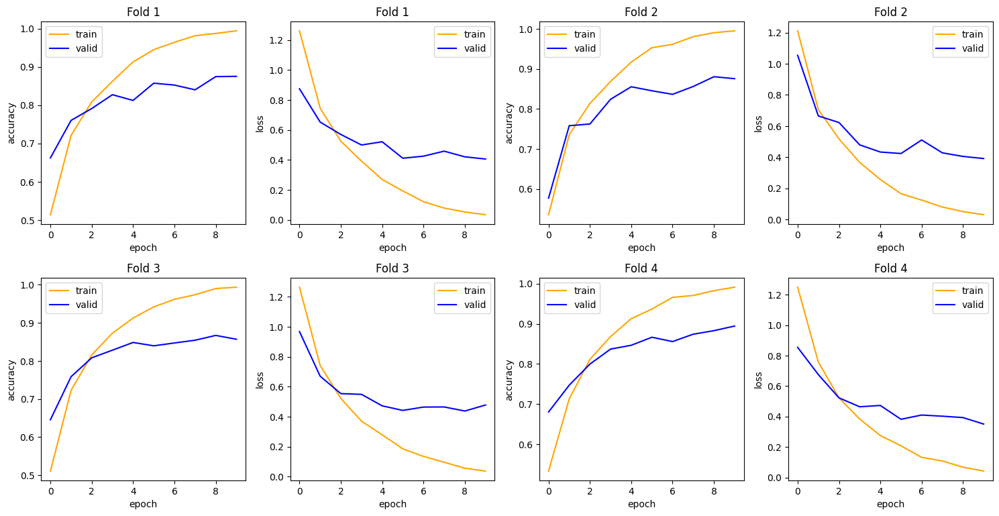

In [18]:
show_validation_score(train_acc_list, train_loss_list, valid_acc_list, valid_loss_list)

In [12]:
df_train_final, df_val_final = train_test_split(df_train, test_size=0.2)

In [13]:
# Custom DataLoader creation
def create_dataloader(images, labels, transform, batch_size, shuffle=True):
    dataset = CustomDataset(images, labels, transform=transform)
    return DataLoader(dataset, batch_size=batch_size, shuffle=shuffle, num_workers=4)

In [14]:
# Data Augmentation and Normalization
train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Load datasets
train_loader = create_dataloader(
    df_train_final['images'].to_list(),
    df_train_final['label'].to_numpy(),
    train_transform,
    batch_size=BATCH_SIZE
)

val_loader = create_dataloader(
    df_val_final['images'].to_list(),
    df_val_final['label'].to_numpy(),
    val_transform,
    batch_size=BATCH_SIZE,
    shuffle=False
)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [4]:
import wandb

In [19]:
wandb.init(
    project="trash-classification",
    config={
    "learning_rate": LR,
    "architecture": "hf_hub:timm/convnextv2_atto.fcmae",
    "dataset": "trashnet",
    "epochs": EPOCHS_FULL,
    "optimizer": "Adam",
    "scheduler": "ReduceLROnPlateau",
    "scheduler_factor": 0.1
    }
)

In [20]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using {device} device')

model = ConvNextV2(NUM_CLASSES).to(device)
loss_fn = nn.CrossEntropyLoss().to(device)
optimizer = optim.Adam(model.parameters(), lr=LR)
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5, verbose=True)

early_stopping_patience = 10
best_val_acc = 0
early_stopping_counter = 0

train_acc_list, train_loss_list = [], []
val_acc_list, val_loss_list = [], []
train_f1_list, val_f1_list = [], []  # For storing F1 scores

for epoch in range(EPOCHS_FULL):
    time_start = time.time()
    print(f'========== Epoch {epoch+1} Start Training ==========')
    model.train()

    epoch_loss = 0
    epoch_accuracy = 0
    all_preds, all_labels = [], []  # For F1-score and confusion matrix calculation in training

    # Training loop
    pbar = tqdm(enumerate(train_loader), total=len(train_loader))
    for step, (img, label) in pbar:
        img, label = img.to(device), label.to(device)

        optimizer.zero_grad()
        output = model(img)
        loss = loss_fn(output, label)
        loss.backward()
        optimizer.step()

        acc = (output.argmax(dim=1) == label).float().mean()
        epoch_accuracy += acc / len(train_loader)
        epoch_loss += loss / len(train_loader)

        # Collect predictions for F1-score and confusion matrix calculation
        _, preds = output.max(1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(label.cpu().numpy())

        wandb.log({"train_batch_loss": loss,
                   "train_batch_acc": acc})

    # Calculate F1-score for the training set
    train_f1 = f1_score(all_labels, all_preds, average='weighted')
    train_f1_list.append(train_f1)

    # Calculate confusion matrix for the training set
    wandb.log({"train_conf_mat": wandb.plot.confusion_matrix(probs=None,
                                                            y_true=all_labels, preds=all_preds,
                                                            class_names=labels_name)})

    # Validation loop
    model.eval()
    with torch.no_grad():
        val_loss = 0
        val_accuracy = 0
        val_preds, val_labels = [], []  # For F1-score and confusion matrix calculation in validation
        for img, label in val_loader:
            img, label = img.to(device), label.to(device)
            output = model(img)
            loss = loss_fn(output, label)

            val_loss += loss / len(val_loader)
            acc = (output.argmax(dim=1) == label).float().mean()
            val_accuracy += acc / len(val_loader)

            # Collect predictions for F1-score and confusion matrix calculation
            _, preds = output.max(1)
            val_preds.extend(preds.cpu().numpy())
            val_labels.extend(label.cpu().numpy())

    # Calculate F1-score for the validation set
    val_f1 = f1_score(val_labels, val_preds, average='weighted')
    val_f1_list.append(val_f1)

    # Calculate confusion matrix for the validation set
    wandb.log({"val_conf_mat": wandb.plot.confusion_matrix(probs=None,
                                                          y_true=val_labels, preds=val_preds,
                                                          class_names=labels_name)})

    # Log results
    train_acc_list.append(epoch_accuracy.detach().cpu().numpy())
    train_loss_list.append(epoch_loss.detach().cpu().numpy())
    val_acc_list.append(val_accuracy.detach().cpu().numpy())
    val_loss_list.append(val_loss.detach().cpu().numpy())

    scheduler.step(val_loss)  # Update learning rate scheduler

    exec_t = int((time.time() - time_start) / 60)
    print(f"Epoch: {epoch+1} - Train Loss: {epoch_loss:.4f} - Train Acc: {epoch_accuracy:.4f} - Train F1: {train_f1:.4f} - Val Loss: {val_loss:.4f} - Val Acc: {val_accuracy:.4f} - Val F1: {val_f1:.4f} / Exec Time: {exec_t} min\n")

    # Log metrics to W&B
    wandb.log({"train_loss": epoch_loss,
               "train_acc": epoch_accuracy,
               "train_f1": train_f1,
               "val_loss": val_loss,
               "val_accuracy": val_accuracy,
               "val_f1": val_f1})

    # Early stopping
    if val_accuracy > best_val_acc:
        best_val_acc = val_accuracy
        early_stopping_counter = 0
        print("Validation accuracy improved, saving model.")
        torch.save(model.state_dict(), 'best_model.pth')  # Save best model
    else:
        early_stopping_counter += 1
        print(f"No improvement in validation accuracy for {early_stopping_counter} epochs.")

    if early_stopping_counter >= early_stopping_patience:
        print("Early stopping triggered.")
        break

Using cuda device
========== Epoch 1 Start Training ==========


/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/102 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 1 - Train Loss: 1.3390 - Train Acc: 0.4838 - Train F1: 0.4639 - Val Loss: 1.0321 - Val Acc: 0.5864 - Val F1: 0.5591 / Exec Time: 0 min

Validation accuracy improved, saving model.
========== Epoch 2 Start Training ==========


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/102 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 2 - Train Loss: 0.9236 - Train Acc: 0.6566 - Train F1: 0.6490 - Val Loss: 0.7755 - Val Acc: 0.7133 - Val F1: 0.7000 / Exec Time: 0 min

Validation accuracy improved, saving model.
========== Epoch 3 Start Training ==========


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/102 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 3 - Train Loss: 0.6952 - Train Acc: 0.7399 - Train F1: 0.7360 - Val Loss: 0.6983 - Val Acc: 0.7320 - Val F1: 0.7201 / Exec Time: 0 min

Validation accuracy improved, saving model.
========== Epoch 4 Start Training ==========


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/102 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 4 - Train Loss: 0.5717 - Train Acc: 0.7901 - Train F1: 0.7874 - Val Loss: 0.5888 - Val Acc: 0.7897 - Val F1: 0.7807 / Exec Time: 0 min

Validation accuracy improved, saving model.
========== Epoch 5 Start Training ==========


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/102 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 5 - Train Loss: 0.4745 - Train Acc: 0.8290 - Train F1: 0.8317 - Val Loss: 0.5537 - Val Acc: 0.7921 - Val F1: 0.7858 / Exec Time: 0 min

Validation accuracy improved, saving model.
========== Epoch 6 Start Training ==========


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/102 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 6 - Train Loss: 0.4421 - Train Acc: 0.8379 - Train F1: 0.8361 - Val Loss: 0.5222 - Val Acc: 0.8245 - Val F1: 0.8174 / Exec Time: 0 min

Validation accuracy improved, saving model.
========== Epoch 7 Start Training ==========


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/102 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 7 - Train Loss: 0.3462 - Train Acc: 0.8796 - Train F1: 0.8783 - Val Loss: 0.4890 - Val Acc: 0.8305 - Val F1: 0.8278 / Exec Time: 0 min

Validation accuracy improved, saving model.
========== Epoch 8 Start Training ==========


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/102 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 8 - Train Loss: 0.3046 - Train Acc: 0.8906 - Train F1: 0.8894 - Val Loss: 0.4120 - Val Acc: 0.8582 - Val F1: 0.8534 / Exec Time: 0 min

Validation accuracy improved, saving model.
========== Epoch 9 Start Training ==========


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/102 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 9 - Train Loss: 0.2602 - Train Acc: 0.9056 - Train F1: 0.9093 - Val Loss: 0.4864 - Val Acc: 0.8510 - Val F1: 0.8459 / Exec Time: 0 min

No improvement in validation accuracy for 1 epochs.
========== Epoch 10 Start Training ==========


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/102 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 10 - Train Loss: 0.2554 - Train Acc: 0.9075 - Train F1: 0.9068 - Val Loss: 0.4053 - Val Acc: 0.8642 - Val F1: 0.8588 / Exec Time: 0 min

Validation accuracy improved, saving model.
========== Epoch 11 Start Training ==========


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/102 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 11 - Train Loss: 0.1889 - Train Acc: 0.9332 - Train F1: 0.9325 - Val Loss: 0.5719 - Val Acc: 0.7981 - Val F1: 0.7948 / Exec Time: 0 min

No improvement in validation accuracy for 1 epochs.
========== Epoch 12 Start Training ==========


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/102 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 12 - Train Loss: 0.1786 - Train Acc: 0.9403 - Train F1: 0.9397 - Val Loss: 0.4597 - Val Acc: 0.8630 - Val F1: 0.8574 / Exec Time: 0 min

No improvement in validation accuracy for 2 epochs.
========== Epoch 13 Start Training ==========


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/102 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 13 - Train Loss: 0.1301 - Train Acc: 0.9565 - Train F1: 0.9560 - Val Loss: 0.4375 - Val Acc: 0.8563 - Val F1: 0.8555 / Exec Time: 0 min

No improvement in validation accuracy for 3 epochs.
========== Epoch 14 Start Training ==========


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/102 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 14 - Train Loss: 0.1258 - Train Acc: 0.9580 - Train F1: 0.9623 - Val Loss: 0.4033 - Val Acc: 0.8714 - Val F1: 0.8670 / Exec Time: 0 min

Validation accuracy improved, saving model.
========== Epoch 15 Start Training ==========


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/102 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 15 - Train Loss: 0.1256 - Train Acc: 0.9623 - Train F1: 0.9620 - Val Loss: 0.4314 - Val Acc: 0.8570 - Val F1: 0.8523 / Exec Time: 0 min

No improvement in validation accuracy for 1 epochs.
========== Epoch 16 Start Training ==========


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/102 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 16 - Train Loss: 0.1114 - Train Acc: 0.9629 - Train F1: 0.9626 - Val Loss: 0.3967 - Val Acc: 0.8786 - Val F1: 0.8745 / Exec Time: 0 min

Validation accuracy improved, saving model.
========== Epoch 17 Start Training ==========


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/102 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 17 - Train Loss: 0.0786 - Train Acc: 0.9782 - Train F1: 0.9780 - Val Loss: 0.4065 - Val Acc: 0.8846 - Val F1: 0.8815 / Exec Time: 0 min

Validation accuracy improved, saving model.
========== Epoch 18 Start Training ==========


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/102 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 18 - Train Loss: 0.0796 - Train Acc: 0.9767 - Train F1: 0.9765 - Val Loss: 0.4207 - Val Acc: 0.8774 - Val F1: 0.8736 / Exec Time: 0 min

No improvement in validation accuracy for 1 epochs.
========== Epoch 19 Start Training ==========


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/102 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 19 - Train Loss: 0.0634 - Train Acc: 0.9825 - Train F1: 0.9824 - Val Loss: 0.4204 - Val Acc: 0.8779 - Val F1: 0.8773 / Exec Time: 0 min

No improvement in validation accuracy for 2 epochs.
========== Epoch 20 Start Training ==========


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/102 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 20 - Train Loss: 0.0858 - Train Acc: 0.9703 - Train F1: 0.9700 - Val Loss: 0.4447 - Val Acc: 0.8719 - Val F1: 0.8713 / Exec Time: 0 min

No improvement in validation accuracy for 3 epochs.
========== Epoch 21 Start Training ==========


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/102 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 21 - Train Loss: 0.0509 - Train Acc: 0.9865 - Train F1: 0.9864 - Val Loss: 0.4081 - Val Acc: 0.8779 - Val F1: 0.8769 / Exec Time: 0 min

No improvement in validation accuracy for 4 epochs.
========== Epoch 22 Start Training ==========


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/102 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 22 - Train Loss: 0.0332 - Train Acc: 0.9908 - Train F1: 0.9907 - Val Loss: 0.4481 - Val Acc: 0.8666 - Val F1: 0.8621 / Exec Time: 0 min

No improvement in validation accuracy for 5 epochs.
========== Epoch 23 Start Training ==========


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/102 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 23 - Train Loss: 0.0242 - Train Acc: 0.9951 - Train F1: 0.9951 - Val Loss: 0.4098 - Val Acc: 0.8786 - Val F1: 0.8747 / Exec Time: 0 min

No improvement in validation accuracy for 6 epochs.
========== Epoch 24 Start Training ==========


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/102 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 24 - Train Loss: 0.0189 - Train Acc: 0.9969 - Train F1: 0.9969 - Val Loss: 0.3983 - Val Acc: 0.8822 - Val F1: 0.8786 / Exec Time: 0 min

No improvement in validation accuracy for 7 epochs.
========== Epoch 25 Start Training ==========


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/102 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 25 - Train Loss: 0.0186 - Train Acc: 0.9963 - Train F1: 0.9963 - Val Loss: 0.3915 - Val Acc: 0.8894 - Val F1: 0.8860 / Exec Time: 0 min

Validation accuracy improved, saving model.
========== Epoch 26 Start Training ==========


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/102 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 26 - Train Loss: 0.0170 - Train Acc: 0.9972 - Train F1: 0.9972 - Val Loss: 0.3839 - Val Acc: 0.8930 - Val F1: 0.8896 / Exec Time: 0 min

Validation accuracy improved, saving model.
========== Epoch 27 Start Training ==========


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/102 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 27 - Train Loss: 0.0134 - Train Acc: 0.9982 - Train F1: 0.9981 - Val Loss: 0.3914 - Val Acc: 0.8930 - Val F1: 0.8898 / Exec Time: 0 min

No improvement in validation accuracy for 1 epochs.
========== Epoch 28 Start Training ==========


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/102 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 28 - Train Loss: 0.0152 - Train Acc: 0.9985 - Train F1: 0.9985 - Val Loss: 0.3910 - Val Acc: 0.8918 - Val F1: 0.8885 / Exec Time: 0 min

No improvement in validation accuracy for 2 epochs.
========== Epoch 29 Start Training ==========


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/102 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 29 - Train Loss: 0.0131 - Train Acc: 0.9985 - Train F1: 0.9985 - Val Loss: 0.3897 - Val Acc: 0.8894 - Val F1: 0.8861 / Exec Time: 0 min

No improvement in validation accuracy for 3 epochs.
========== Epoch 30 Start Training ==========


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/102 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 30 - Train Loss: 0.0126 - Train Acc: 0.9976 - Train F1: 0.9975 - Val Loss: 0.3923 - Val Acc: 0.8882 - Val F1: 0.8846 / Exec Time: 0 min

No improvement in validation accuracy for 4 epochs.
========== Epoch 31 Start Training ==========


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/102 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 31 - Train Loss: 0.0121 - Train Acc: 0.9988 - Train F1: 0.9988 - Val Loss: 0.3856 - Val Acc: 0.8966 - Val F1: 0.8935 / Exec Time: 0 min

Validation accuracy improved, saving model.
========== Epoch 32 Start Training ==========


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/102 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 32 - Train Loss: 0.0152 - Train Acc: 0.9963 - Train F1: 0.9963 - Val Loss: 0.3912 - Val Acc: 0.8966 - Val F1: 0.8935 / Exec Time: 0 min

No improvement in validation accuracy for 1 epochs.
========== Epoch 33 Start Training ==========


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/102 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 33 - Train Loss: 0.0123 - Train Acc: 0.9982 - Train F1: 0.9981 - Val Loss: 0.3901 - Val Acc: 0.8954 - Val F1: 0.8922 / Exec Time: 0 min

No improvement in validation accuracy for 2 epochs.
========== Epoch 34 Start Training ==========


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/102 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 34 - Train Loss: 0.0140 - Train Acc: 0.9979 - Train F1: 0.9978 - Val Loss: 0.3903 - Val Acc: 0.8954 - Val F1: 0.8922 / Exec Time: 0 min

No improvement in validation accuracy for 3 epochs.
========== Epoch 35 Start Training ==========


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/102 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 35 - Train Loss: 0.0115 - Train Acc: 0.9976 - Train F1: 0.9975 - Val Loss: 0.3899 - Val Acc: 0.8930 - Val F1: 0.8898 / Exec Time: 0 min

No improvement in validation accuracy for 4 epochs.
========== Epoch 36 Start Training ==========


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/102 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 36 - Train Loss: 0.0128 - Train Acc: 0.9991 - Train F1: 0.9991 - Val Loss: 0.3908 - Val Acc: 0.8942 - Val F1: 0.8911 / Exec Time: 0 min

No improvement in validation accuracy for 5 epochs.
========== Epoch 37 Start Training ==========


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/102 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 37 - Train Loss: 0.0117 - Train Acc: 0.9982 - Train F1: 0.9981 - Val Loss: 0.3903 - Val Acc: 0.8954 - Val F1: 0.8923 / Exec Time: 0 min

No improvement in validation accuracy for 6 epochs.
========== Epoch 38 Start Training ==========


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/102 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 38 - Train Loss: 0.0107 - Train Acc: 0.9988 - Train F1: 0.9988 - Val Loss: 0.3905 - Val Acc: 0.8918 - Val F1: 0.8886 / Exec Time: 0 min

No improvement in validation accuracy for 7 epochs.
========== Epoch 39 Start Training ==========


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/102 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 39 - Train Loss: 0.0114 - Train Acc: 0.9985 - Train F1: 0.9985 - Val Loss: 0.3904 - Val Acc: 0.8918 - Val F1: 0.8886 / Exec Time: 0 min

No improvement in validation accuracy for 8 epochs.
========== Epoch 40 Start Training ==========


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/102 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 40 - Train Loss: 0.0125 - Train Acc: 0.9979 - Train F1: 0.9978 - Val Loss: 0.3903 - Val Acc: 0.8918 - Val F1: 0.8886 / Exec Time: 0 min

No improvement in validation accuracy for 9 epochs.
========== Epoch 41 Start Training ==========


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/102 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 41 - Train Loss: 0.0112 - Train Acc: 0.9991 - Train F1: 0.9991 - Val Loss: 0.3905 - Val Acc: 0.8918 - Val F1: 0.8886 / Exec Time: 0 min

No improvement in validation accuracy for 10 epochs.
Early stopping triggered.


In [21]:
wandb.finish()

train_acc,▁▃▄▅▆▆▆▇▇▇▇▇▇▇██████████████████████████
train_batch_acc,▁▄▂▅▄█▆█▆███▇▇████▇█████████████████████
train_batch_loss,█▅▆▅▅▄▃▂▃▂▂▂▁▂▁▁▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_f1,▁▃▅▅▆▆▆▇▇▇▇▇▇███████████████████████████
train_loss,█▆▅▄▃▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_accuracy,▁▄▄▆▆▆▇▇▇▇▆▇▇▇▇████▇█▇██████████████████
val_f1,▁▄▄▆▆▆▇▇▇▇▆▇▇▇▇██████▇██████████████████
val_loss,█▅▄▃▃▂▂▁▂▁▃▂▂▁▂▁▁▁▁▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_acc,0.99908
train_batch_acc,1
train_batch_loss,0.00214


I made a mistake, should have stored the best performing model in the training loop but since the training took so much time, I only use the last trained model for model result analysis.

In [22]:
torch.save(model.state_dict(), 'best_model.pth')

# Testing

In [24]:
test_loader = create_dataloader(
    df_test['images'].to_list(),
    df_test['label'].to_numpy(),
    val_transform,
    batch_size=BATCH_SIZE
)

In [27]:
import torch.nn.functional as F
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Test Accuracy: 0.8882
Test F1-Score: 0.8881
Test Loss: 0.3983


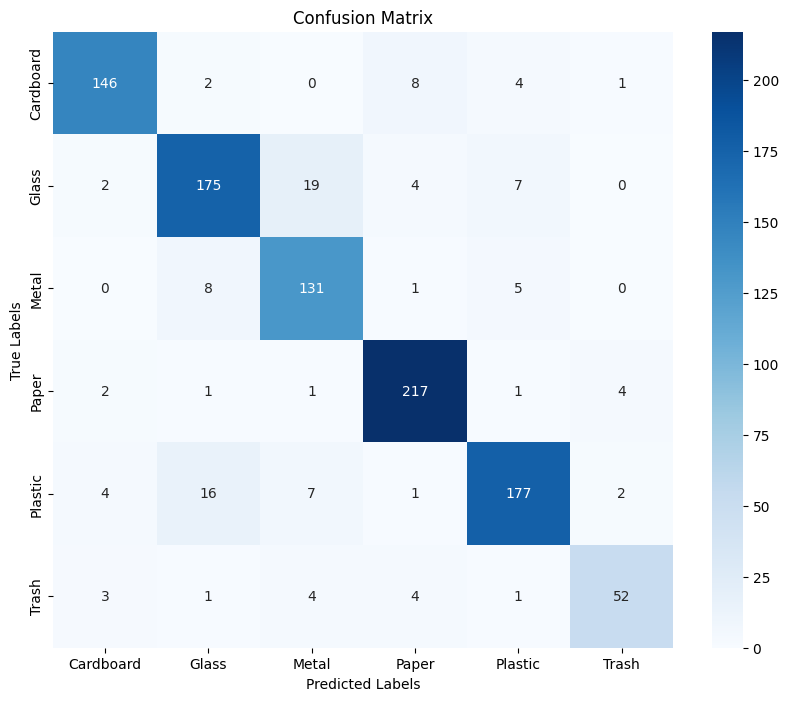

In [28]:
all_preds = []
all_labels = []
total_loss = 0
correct_predictions = 0
total_samples = 0
class_names = labels_name  # Replace with actual class names

# Calculate F1, accuracy, loss, and confusion matrix
for img, label in test_loader:
    img, label = img.to(device), label.to(device)

    # Forward pass
    output = model(img)

    # Calculate loss
    loss = F.cross_entropy(output, label)
    total_loss += loss.item()

    # Get predictions
    _, preds = torch.max(output, dim=1)
    all_preds.extend(preds.cpu().numpy())
    all_labels.extend(label.cpu().numpy())

    # Calculate accuracy
    correct_predictions += (preds == label).sum().item()
    total_samples += label.size(0)

# Convert lists to numpy arrays for metrics calculation
all_preds = np.array(all_preds)
all_labels = np.array(all_labels)

# Calculate accuracy
accuracy = correct_predictions / total_samples

# Calculate F1-score
f1 = f1_score(all_labels, all_preds, average='weighted')  # weighted F1-score

# Calculate confusion matrix
conf_mat = confusion_matrix(all_labels, all_preds)

# Log results
print(f'Test Accuracy: {accuracy:.4f}')
print(f'Test F1-Score: {f1:.4f}')
print(f'Test Loss: {total_loss / len(test_loader):.4f}')

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


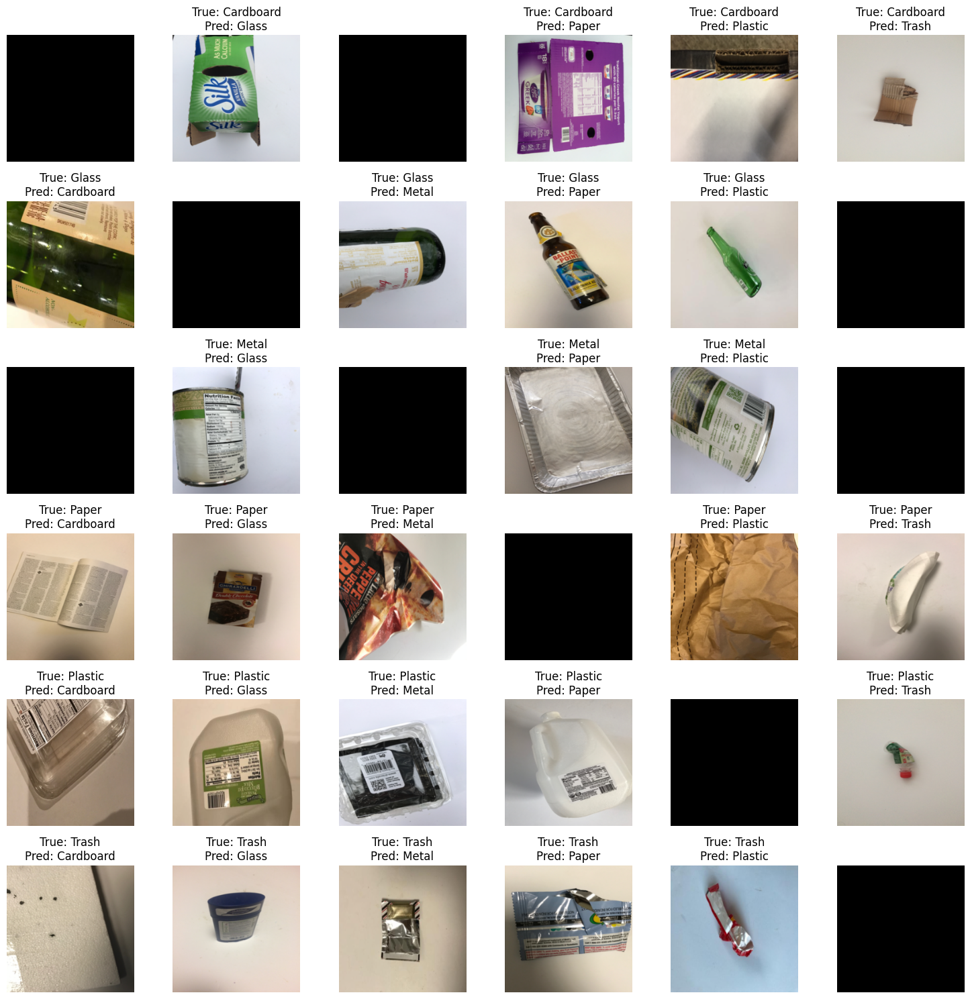

In [44]:
def plot_misclassification(model, dataloader, class_names, device, mean, std):
    model.eval()
    all_preds, all_labels = [], []
    misclassified_images = {i: {j: [] for j in range(len(class_names))} for i in range(len(class_names))}

    mean = np.array(mean)
    std = np.array(std)

    with torch.no_grad():
        for img, label in dataloader:
            img, label = img.to(device), label.to(device)
            output = model(img)
            _, preds = output.max(1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(label.cpu().numpy())

            for i, true_label in enumerate(label):
                pred_label = preds[i].item()
                if true_label != pred_label:
                    misclassified_images[true_label.item()][pred_label].append(img[i])

    conf_mat = confusion_matrix(all_labels, all_preds)

    fig, axes = plt.subplots(len(class_names), len(class_names), figsize=(15, 15))
    for i in range(len(class_names)):
        for j in range(len(class_names)):
            ax = axes[i, j]
            if i == j:
                ax.imshow(np.zeros((32, 32, 3)))
                ax.set_title('')
            elif len(misclassified_images[i][j]) > 0:
                random_idx = random.randint(0, len(misclassified_images[i][j]) - 1)
                img = misclassified_images[i][j][random_idx].cpu().numpy()

                img = img * std[:, None, None] + mean[:, None, None]
                img = np.clip(img, 0, 1)

                img = img.transpose(1, 2, 0)

                ax.imshow(img)
                ax.set_title(f'True: {class_names[i]}\nPred: {class_names[j]}')
            else:
                ax.imshow(np.zeros((32, 32, 3)))
                ax.set_title('')

            ax.axis('off')

    plt.tight_layout()
    plt.show()

mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]
plot_misclassification(model, test_loader, labels_name, device, mean, std)

There are a lot of data that misclassified as:
- **Plastic** that are predicted as **Glass**
- **Glass** that are predicted as **Metal**

In [48]:
def plot_class_predictions(model, dataloader, device, mean, std,
                         pred_class, real_class, num_samples):
    # Convert mean and std to numpy arrays
    mean = np.array(mean)
    std = np.array(std)

    model.eval()
    samples = []
    count = 0

    # Collect samples
    with torch.no_grad():
        for images, labels in dataloader:
            if count >= num_samples:
                break

            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)

            # Find samples where prediction matches pred_class and true label matches real_class
            mask = (preds == pred_class) & (labels == real_class)
            filtered_images = images[mask]

            for img in filtered_images:
                if count >= num_samples:
                    break
                samples.append(img)
                count += 1

    if len(samples) == 0:
        print(f"No samples found where model predicted class {pred_class} for true class {real_class}")
        return

    # Create plot grid
    num_cols = min(5, num_samples)
    num_rows = (len(samples) + num_cols - 1) // num_cols
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols*3, num_rows*3))

    if num_rows == 1 and num_cols == 1:
        axes = np.array([[axes]])
    elif num_rows == 1 or num_cols == 1:
        axes = axes.reshape(-1, 1) if num_cols == 1 else axes.reshape(1, -1)

    # Plot images
    for idx, img in enumerate(samples):
        row = idx // num_cols
        col = idx % num_cols

        # Denormalize image
        img = img.cpu().numpy()
        img = img * std[:, None, None] + mean[:, None, None]
        img = np.clip(img.transpose(1, 2, 0), 0, 1)

        axes[row, col].imshow(img)
        axes[row, col].axis('off')

    # Turn off empty subplots
    for idx in range(len(samples), num_rows * num_cols):
        row = idx // num_cols
        col = idx % num_cols
        axes[row, col].axis('off')

    plt.suptitle(f'Predicted Class: {labels_name[pred_class]}, True Class: {labels_name[real_class]}')
    plt.tight_layout()
    plt.show()

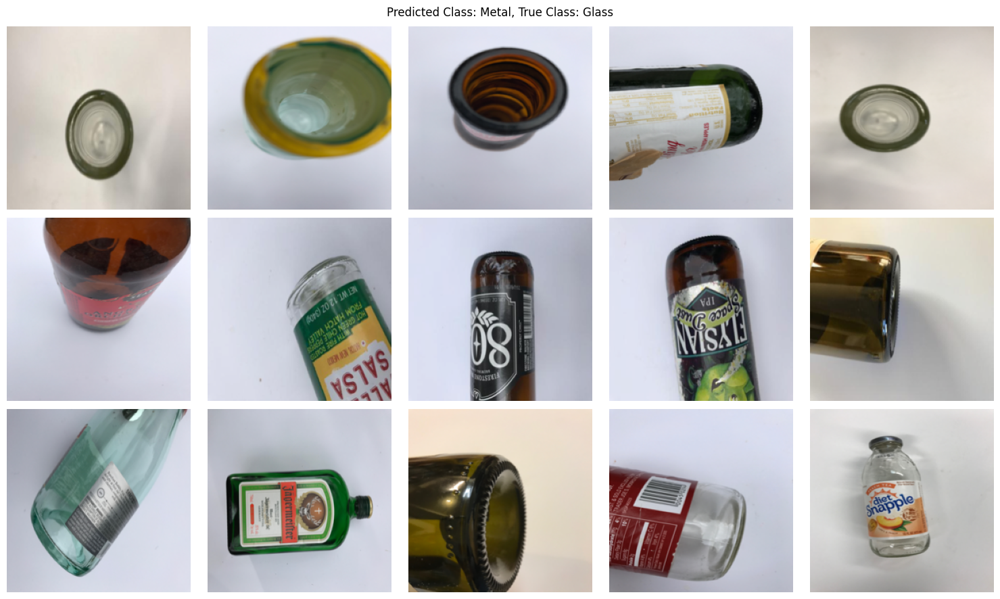

In [51]:
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

plot_class_predictions(model, test_loader, device, mean, std, 2, 1, 15)

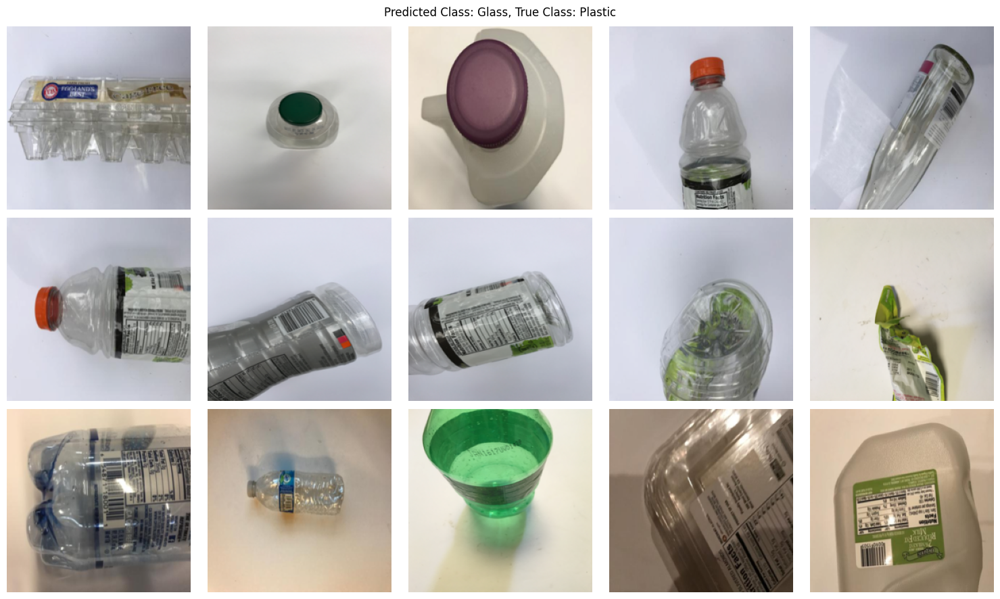

In [52]:
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

plot_class_predictions(model, test_loader, device, mean, std, 1, 4, 15)

In [55]:
!pip install grad-cam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 39.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad-cam: filename=grad_cam-1.5.4-py3-none-any.whl size=39588 sha256=3fb22da16c42c1a2cc9d26c0ab4a689961ad7a3aa77a83a3e8e1857e5c0e4c29
  Stored in directory: /root/.cache/pip/wheels/50/b0/82/1f97b5348c7fe9f0ce0ba18497202cafa5dec4562bd5292680
Successfully built grad-cam


In [73]:
from pytorch_grad_cam import GradCAM, HiResCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

In [81]:
iter(test_loader)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


# GradCAM

In [133]:
def visualize_gradcam(model, test_loader, device, target_class, real_class, max_samples=10):
    model.eval()
    samples = []
    count = 0

    with torch.no_grad():
        for images, labels in test_loader:
            if count >= max_samples:
                break

            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)

            mask = (preds == target_class) & (labels == real_class)
            filtered_images = images[mask]

            for img in filtered_images:
                if count >= max_samples:
                    break
                samples.append(img)
                count += 1

    target_layers = [model.convnext.stages[3].blocks[1].conv_dw]
    targets = [ClassifierOutputTarget(target_class)]

    fig, axes = plt.subplots(2, 5, figsize=(15, 6))
    axes = axes.flatten()

    for i, img in enumerate(samples):
        image_tensor = img[None, :, :, :]
        image_tensor = image_tensor.to(device)

        def tensor_to_rgb(tensor):
            mean = np.array([0.485, 0.456, 0.406])
            std = np.array([0.229, 0.224, 0.225])
            image = tensor.cpu().numpy()
            image = image.transpose(1, 2, 0)  # CxHxW to HxWxC
            image = std * image + mean  # Denormalize
            image = np.clip(image, 0, 1)  # Clip to [0, 1]
            return image

        with GradCAM(model=model, target_layers=target_layers) as cam:
            grayscale_cam = cam(input_tensor=image_tensor, targets=targets)
            grayscale_cam = grayscale_cam[0, :]

            visualization = show_cam_on_image(tensor_to_rgb(image_tensor.squeeze()), grayscale_cam, use_rgb=True)

            axes[i].imshow(visualization)
            axes[i].axis('off')
            axes[i].set_title(f"Sample {i+1}")

    plt.tight_layout()
    plt.show()

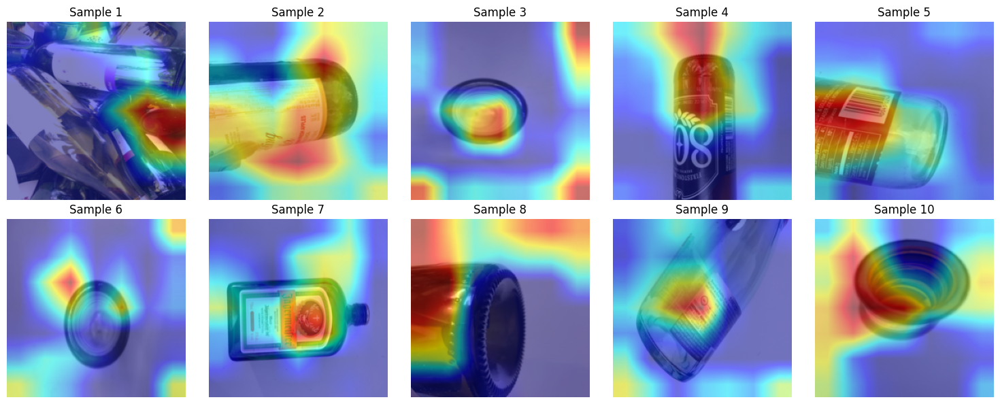

In [132]:
visualize_gradcam(model, test_loader, device, target_class=2, real_class=1, max_samples=10)

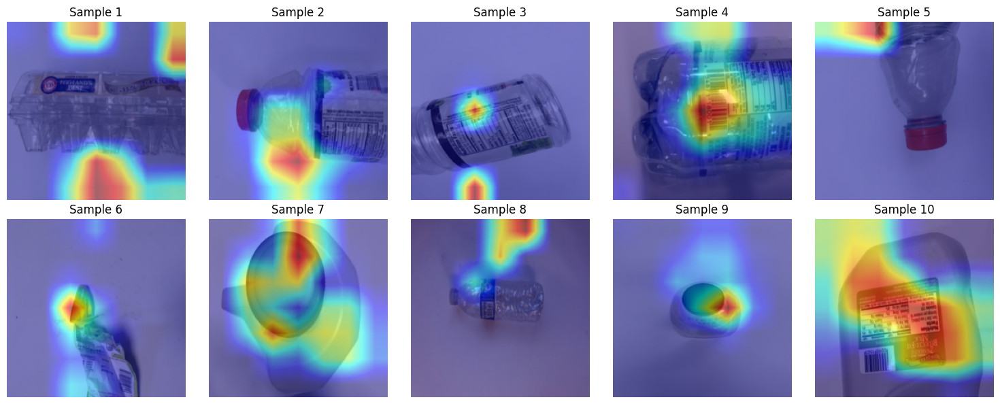

In [134]:
visualize_gradcam(model, test_loader, device, target_class=1, real_class=4, max_samples=10)

# Model Versioning using WanDB

In [7]:
wandb.init(project="trash-classification", id="s64jgb4p", resume="must")
wandb.log_artifact("best_model.pth", name='latest_model', type='model')

<IPython.core.display.Javascript object>

wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


<Artifact latest_model>

In [8]:
wandb.finish()

train_acc,0.99908
train_batch_acc,1
train_batch_loss,0.00214
train_f1,0.99907
train_loss,0.01118
val_accuracy,0.89183
val_f1,0.88861
val_loss,0.39047
